<a href="https://colab.research.google.com/github/Mike-R-B-Lab/Stock_Portfolio_Optimization/blob/main/Network_Stock_Portfolio_Optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Network Stock Portfolio Optimization**

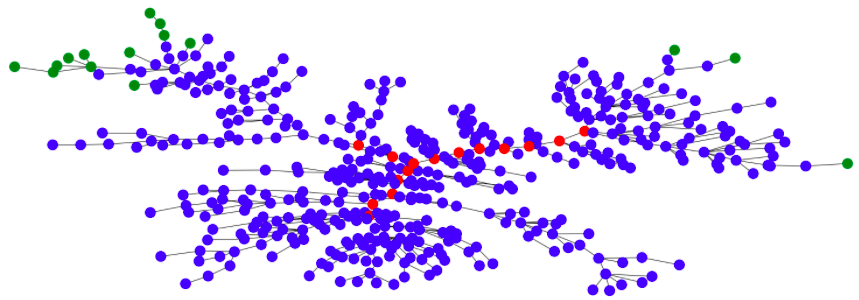

## **Context and Problem Statement**

Active investing in the asset management industry **aims to beat the stock market’s average returns**, for which portfolio managers track a particular index and try to beat it by creating their own portfolios.

Portfolio construction involves selection of stocks that have a **higher probability of giving better returns** in comparison to the tracking index, like **S&P 500**. In this project, we will use the concept of Network Analysis to select a basket of stocks and create two portfolios. We will then simulate portfolio value by investing a certain amount, keeping the portfolio for an entire year and we will then compare it against the S&P 500 index.

In this project we will try to follow the approach mentioned in the below research paper:

**[Dynamic portfolio strategy using a clustering
approach](https://arxiv.org/pdf/1608.03058.pdf)**

## **Proposed Approach**

- Collect the price data for all S&P 500 components from 2011 till 2020
- Compute log returns for the S&P 500 components for same time period
- Compute the **correlation matrix** for the above log returns
- Find out the **Top 15 central and peripheral stocks** based on the following network topological parameters:
    - Degree centrality
    - Betweenness centrality
    - Distance on degree criterion
    - Distance on correlation criterion
    - Distance on distance criterion
- Simulate the performance of central and peripheral portfolios against the performance of S&P 500 for the year 2021    

## **Loading the Libraries**

We will need to first install the library - `pandas_datareader` using `!pip install pandas_datareader`

In [1]:
import tqdm
import requests
import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import plotly.express as px
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import pandas_datareader.data as web

import warnings
warnings.filterwarnings('ignore')

## **Getting the Price Data for all the S&P 500 components in the last 10 years**

In [3]:
# Connecting to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Importing S&P data from 2010 - 2020
price_data = pd.read_csv('/content/drive/MyDrive/MIT_certificate/Notes/Week 3 - Data Analysis and Visualization/Class 2: Network Analysis/Copy of snp500_price_data_2011_to_2020 (1).csv', index_col=[0])

In [10]:
price_data.shape

(2518, 505)

In [11]:
null_count_last_row = price_data.iloc[-1].isnull().sum()

# Print the result
print(f"Number of null values in the last row: {null_count_last_row}")

Number of null values in the last row: 2


In [13]:
price_data.head(-5)

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG,OGN
Date,,,,,,,,,,,,,,,,,,,,,
2010-12-31,63.855606,8.113162,17.986767,NaN,9.610000,39.143620,11.245819,22.385578,30.780001,31.271172,...,16.221039,23.216919,NaN,28.547478,37.990002,49.212429,21.089169,NaN,NaN,NaN
2011-01-03,64.218163,8.125947,17.952976,NaN,9.800000,39.224346,11.318138,22.623722,31.290001,31.791464,...,16.227924,23.569420,NaN,28.570745,38.200001,50.395058,21.907326,NaN,NaN,NaN
2011-01-04,64.129395,8.100383,18.121916,NaN,9.800000,38.966022,11.327178,22.608845,31.510000,31.676586,...,16.296804,23.665552,NaN,28.134232,37.840000,49.725819,21.550467,NaN,NaN,NaN
2011-01-05,64.129395,8.285738,18.121916,NaN,10.030000,38.974094,11.110217,22.713020,32.220001,32.183357,...,16.200367,23.745670,NaN,28.268110,37.799999,49.762482,21.672325,NaN,NaN,NaN
2011-01-06,63.737186,8.289999,18.084377,NaN,10.050000,39.119389,11.083097,23.583750,32.270000,32.433369,...,16.186602,24.146229,NaN,28.465996,37.480000,48.222305,21.611391,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-17,171.215332,54.131424,106.747635,99.061249,281.989990,260.565369,88.033752,48.213158,495.359985,174.034134,...,64.748268,151.860001,98.807137,106.996475,375.429993,150.142166,41.350929,161.548981,NaN,NaN
2020-12-18,170.992401,54.503666,106.934090,98.645699,293.390015,262.319092,89.934547,48.506062,502.950012,175.898727,...,63.868980,149.190002,99.104309,107.970161,373.000000,150.628235,40.570724,162.472397,NaN,NaN
2020-12-21,170.255798,54.679989,106.070526,97.946831,295.809998,257.560455,88.382065,48.203388,498.390015,174.181366,...,63.182945,145.279999,99.767982,106.839111,375.910004,147.404373,41.903988,159.702133,NaN,NaN


## **Missing Data due to Index Rebalancing**

In [6]:
# Verifying null variables
price_data.T.isnull()

Date,2010-12-31,2011-01-03,2011-01-04,2011-01-05,2011-01-06,2011-01-07,2011-01-10,2011-01-11,2011-01-12,2011-01-13,...,2020-12-17,2020-12-18,2020-12-21,2020-12-22,2020-12-23,2020-12-24,2020-12-28,2020-12-29,2020-12-30,2020-12-31
MMM,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
AOS,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
ABT,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
ABBV,True,True,True,True,True,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
ABMD,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZBH,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
ZION,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
ZTS,True,True,True,True,True,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
CEG,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True


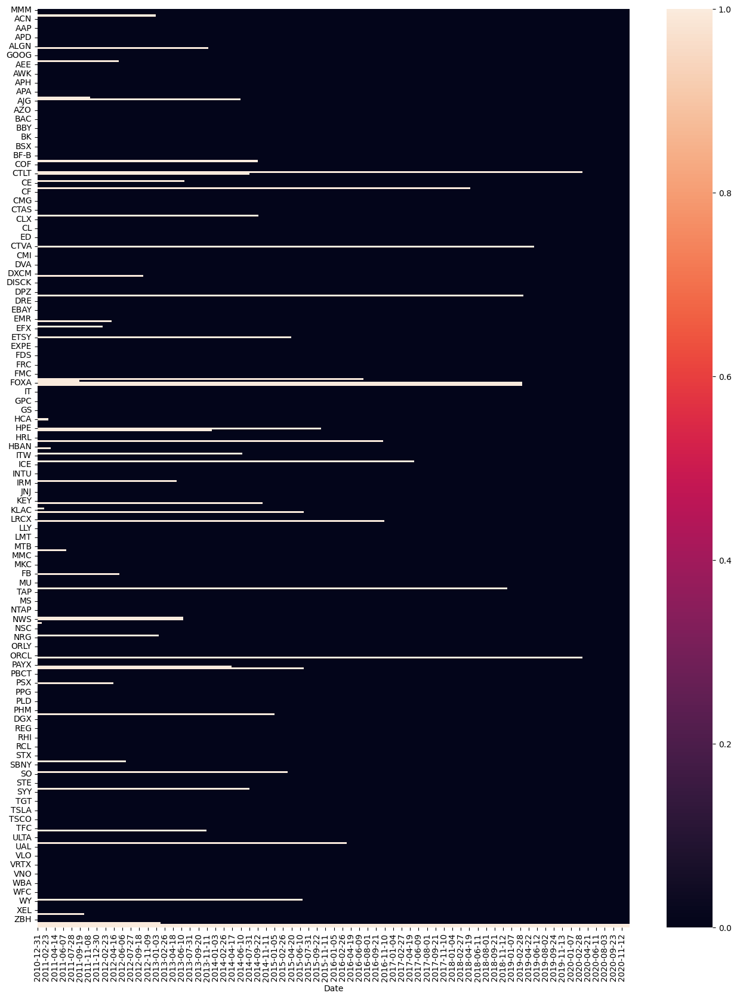

In [12]:
# Visual representation of when some stocks arrived in the S&P 500
figure = plt.figure(figsize=(16, 20))
sns.heatmap(price_data.T.isnull());

The missing data is due to the fact that **certain stocks may move out of the S&P 500** and **certain stocks may enter the S&P 500** in this respective timeframe.

In [14]:
# Dropping na values columnwise
price_data_cleaned = price_data.dropna(axis=1)
price_data_cleaned.index = pd.to_datetime(price_data_cleaned.index)

In [15]:
print(price_data_cleaned.index.dtype)


datetime64[ns]


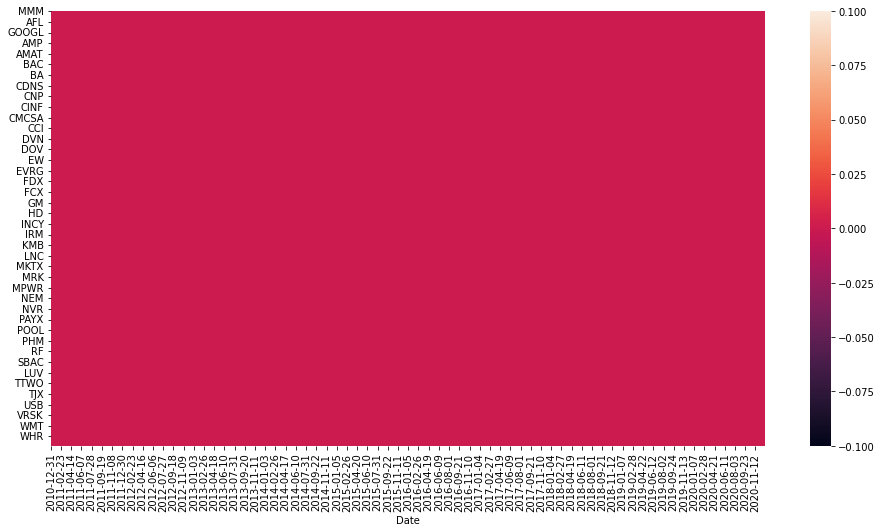

In [ ]:
# Verifying that all columns with NaN values are dropped and data is cleaned
figure = plt.figure(figsize=(16, 8))
sns.heatmap(price_data_cleaned.T.isnull());

## **Getting Yearwise Data**

In [17]:
# Function that will return all the data from 1 year
def get_year_wise_snp_500_data(data, year):
    year_wise_data = data.loc['{}-01-01'.format(year):'{}-12-31'.format(year)]

    return year_wise_data

In [18]:
# Getting year wise data of S&P stocks from 2011 to 2020
snp_500_2011 = get_year_wise_snp_500_data(price_data_cleaned, 2011)
snp_500_2012 = get_year_wise_snp_500_data(price_data_cleaned, 2012)
snp_500_2013 = get_year_wise_snp_500_data(price_data_cleaned, 2013)
snp_500_2014 = get_year_wise_snp_500_data(price_data_cleaned, 2014)
snp_500_2015 = get_year_wise_snp_500_data(price_data_cleaned, 2015)
snp_500_2016 = get_year_wise_snp_500_data(price_data_cleaned, 2016)
snp_500_2017 = get_year_wise_snp_500_data(price_data_cleaned, 2017)
snp_500_2018 = get_year_wise_snp_500_data(price_data_cleaned, 2018)
snp_500_2019 = get_year_wise_snp_500_data(price_data_cleaned, 2019)
snp_500_2020 = get_year_wise_snp_500_data(price_data_cleaned, 2020)

## **Computing the Daily Log Returns**

Statistically, **simple stock returns are always assumed to follow a Log Normal distribution**. It is therefore plausible to use properties of the Normal distribution in statistical estimation for Log returns, but not for the simple returns.

Stock Returns analysis is a time series analysis, in which you also take care of stationarity which is normally obtained from Log returns but not from simple returns.

In [19]:
# Calculating daily log returns by subtracting between two days with the help of shift function
log_returns_2011 = np.log(snp_500_2011.shift(1)) - np.log(snp_500_2011)
log_returns_2012 = np.log(snp_500_2012.shift(1)) - np.log(snp_500_2012)
log_returns_2013 = np.log(snp_500_2013.shift(1)) - np.log(snp_500_2013)
log_returns_2014 = np.log(snp_500_2014.shift(1)) - np.log(snp_500_2014)
log_returns_2015 = np.log(snp_500_2015.shift(1)) - np.log(snp_500_2015)
log_returns_2016 = np.log(snp_500_2016.shift(1)) - np.log(snp_500_2016)
log_returns_2017 = np.log(snp_500_2017.shift(1)) - np.log(snp_500_2017)
log_returns_2018 = np.log(snp_500_2018.shift(1)) - np.log(snp_500_2018)
log_returns_2019 = np.log(snp_500_2019.shift(1)) - np.log(snp_500_2019)
log_returns_2020 = np.log(snp_500_2020.shift(1)) - np.log(snp_500_2020)

## **Computing the Correlation of Returns**

In [21]:
# Computing adjacency matrix:
return_correlation_2011 = log_returns_2011.corr()
return_correlation_2012 = log_returns_2012.corr()
return_correlation_2013 = log_returns_2013.corr()
return_correlation_2014 = log_returns_2014.corr()
return_correlation_2015 = log_returns_2015.corr()
return_correlation_2016 = log_returns_2016.corr()
return_correlation_2017 = log_returns_2017.corr()
return_correlation_2018 = log_returns_2018.corr()
return_correlation_2019 = log_returns_2019.corr()
return_correlation_2020 = log_returns_2020.corr()

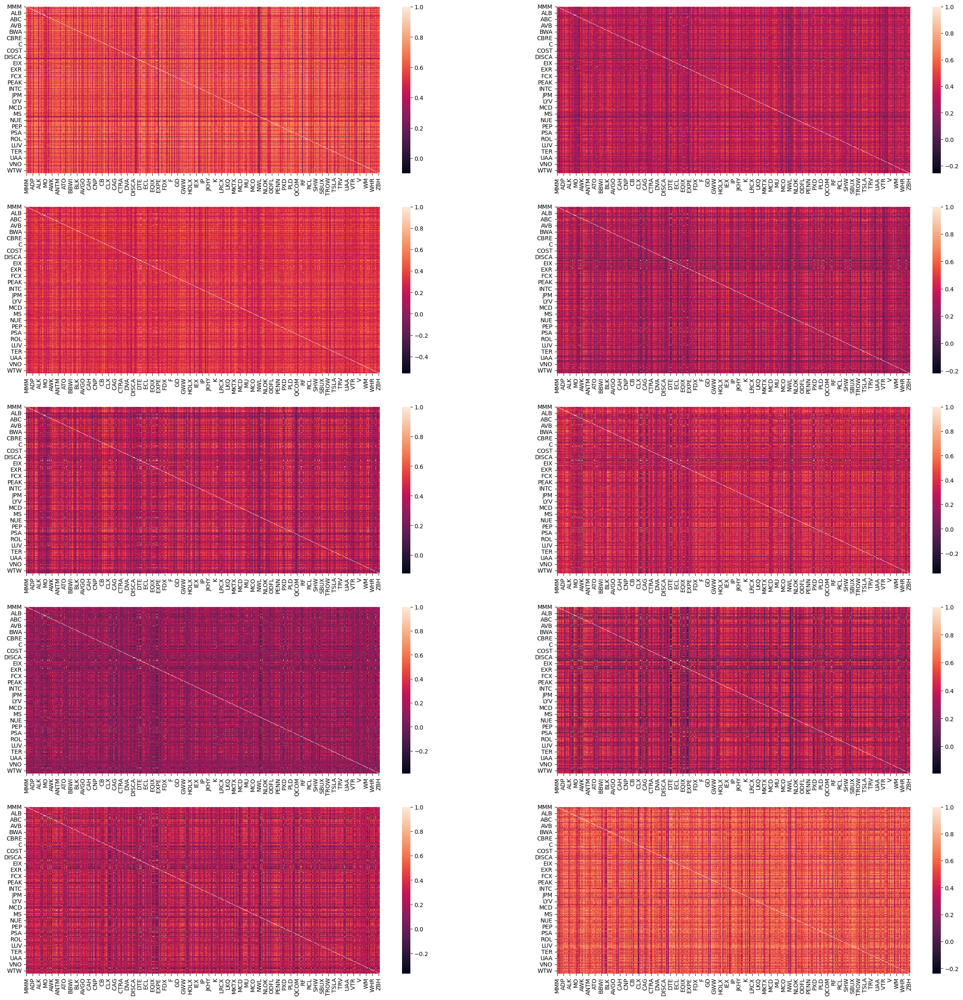

In [22]:
figure, axes = plt.subplots(5, 2, figsize=(30, 30))
sns.heatmap(return_correlation_2011, ax=axes[0, 0]);
sns.heatmap(return_correlation_2012, ax=axes[0, 1]);
sns.heatmap(return_correlation_2013, ax=axes[1, 0]);
sns.heatmap(return_correlation_2014, ax=axes[1, 1]);
sns.heatmap(return_correlation_2015, ax=axes[2, 0]);
sns.heatmap(return_correlation_2016, ax=axes[2, 1]);
sns.heatmap(return_correlation_2017, ax=axes[3, 0]);
sns.heatmap(return_correlation_2018, ax=axes[3, 1]);
sns.heatmap(return_correlation_2019, ax=axes[4, 0]);
sns.heatmap(return_correlation_2020, ax=axes[4, 1]);

## **Inferences**

The first plot for the year 2011 shows that there is high correlation among the stocks due to the bright colors. It shows there was volatility in the market, the prices of the stock went down along with the other stocks and this is the reason for high correlation. We can clearly see the unstable market in the following image :

 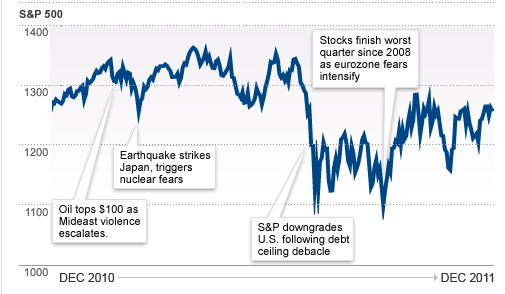

Similarly in 2012, 2014 and 2017 the market is kind of stable, and hence the correlation among stocks is low.

In 2020, due to the COVID pandemic and the volatility in the market, the prices of the stock went down or up along with other stocks, and this is the reason for high correlation.

From this we can infer that, **In stable market conditions, correlation matrices have low correlation values whereas in critical market conditions, correlation matrices have high correlation values.**

## **Creating Graphs**

In [29]:
graph_2011 = nx.Graph(return_correlation_2011)
labels = {node: '' for node in graph_2011.nodes()}

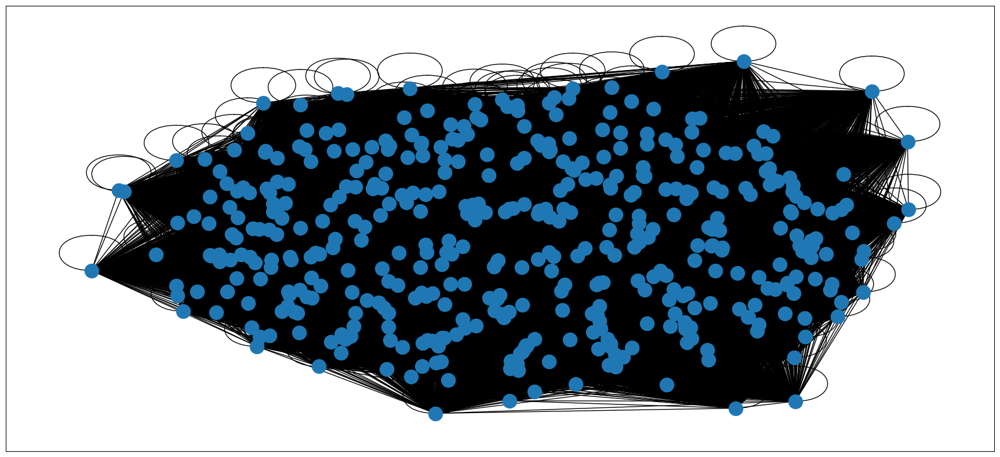

In [30]:
figure = plt.figure(figsize=(22, 10))
nx.draw_networkx(graph_2011, labels = labels, with_labels=True)

This is a **fully connected network** as we created it using the correlation matrix.

A fully connected network means every variable has connections with all the other variables in the network and will also have self-loops.

## **Filtering Graphs using MST**

**MST - Minimum Spanning Tree**

A minimum spanning tree (MST) or minimum weight spanning tree is a subset of the edges of a connected, edge-weighted undirected graph that connects all the vertices together, without any cycles and with the minimum possible total edge weight.That is, it is a spanning tree whose sum of edge weights is as small as possible.

**MST** is one of the popular techniques to eliminate the redundancies and noise and meanwhile maintain the significant links in the network.

While removing redundancy and noise in the data using MST, we might lose some information as well.

In [23]:
# Transforming the correlation into a distance. 1 being the highest correlation
# and -1 being the lowest possible. Multiplying by 2 and finding the square root
# scales the results
distance_2011 = np.sqrt(2 * (1 - return_correlation_2011))
distance_2012 = np.sqrt(2 * (1 - return_correlation_2012))
distance_2013 = np.sqrt(2 * (1 - return_correlation_2013))
distance_2014 = np.sqrt(2 * (1 - return_correlation_2014))
distance_2015 = np.sqrt(2 * (1 - return_correlation_2015))
distance_2016 = np.sqrt(2 * (1 - return_correlation_2016))
distance_2017 = np.sqrt(2 * (1 - return_correlation_2017))
distance_2018 = np.sqrt(2 * (1 - return_correlation_2018))
distance_2019 = np.sqrt(2 * (1 - return_correlation_2019))
distance_2020 = np.sqrt(2 * (1 - return_correlation_2020))

In [25]:
distance_2011

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
MMM,0.000000,0.714910,0.834013,0.967267,0.815788,0.967180,0.712105,0.811267,0.641704,1.015492,...,0.852414,0.788002,0.834836,0.832352,0.808744,0.869617,0.874213,0.731152,0.820681,0.668203
AOS,0.714910,0.000000,0.959413,0.917710,0.819129,0.989290,0.769081,0.777010,0.730072,1.029296,...,0.885057,0.841902,0.904622,0.874687,0.905063,0.872745,0.908098,0.790015,0.872776,0.770025
ABT,0.834013,0.959413,0.000000,1.006081,0.917140,1.013286,0.894598,0.973292,0.733070,1.043202,...,0.993193,0.967112,1.038990,1.055840,0.765332,1.091759,0.926883,0.938328,0.879114,0.958558
ABMD,0.967267,0.917710,1.006081,0.000000,0.979748,1.154363,0.963360,1.010930,0.933354,1.102734,...,1.028589,0.966780,1.084795,1.036478,1.054395,1.051436,1.056472,0.903099,1.063943,0.975216
ACN,0.815788,0.819129,0.917140,0.979748,0.000000,0.993990,0.836932,0.867013,0.730293,1.107532,...,0.964597,0.834292,0.981565,0.897348,0.930386,0.913276,0.928180,0.764716,0.892744,0.851137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XLNX,0.869617,0.872745,1.091759,1.051436,0.913276,1.016811,0.966012,0.857512,0.833360,1.077607,...,1.016524,0.964023,1.057115,0.908955,1.036098,0.000000,1.007959,0.857271,0.983222,0.961578
YUM,0.874213,0.908098,0.926883,1.056472,0.928180,1.017589,0.955733,0.922145,0.848232,1.045102,...,0.998440,0.917502,1.021500,0.919751,0.926984,1.007959,0.000000,0.931639,0.965533,0.938820
ZBRA,0.731152,0.790015,0.938328,0.903099,0.764716,0.997073,0.805560,0.826566,0.742099,1.055202,...,0.866767,0.782777,0.923568,0.844914,0.873045,0.857271,0.931639,0.000000,0.898948,0.816144
ZBH,0.820681,0.872776,0.879114,1.063943,0.892744,1.009801,0.894423,0.877592,0.754373,1.093390,...,0.928332,0.927143,0.964736,1.005689,0.866876,0.983222,0.965533,0.898948,0.000000,0.833043


In [35]:
# Creating the network for every year
distance_2011_graph = nx.Graph(distance_2011)
distance_2012_graph = nx.Graph(distance_2012)
distance_2013_graph = nx.Graph(distance_2013)
distance_2014_graph = nx.Graph(distance_2014)
distance_2015_graph = nx.Graph(distance_2015)
distance_2016_graph = nx.Graph(distance_2016)
distance_2017_graph = nx.Graph(distance_2017)
distance_2018_graph = nx.Graph(distance_2018)
distance_2019_graph = nx.Graph(distance_2019)
distance_2020_graph = nx.Graph(distance_2020)

In [38]:
# Filtering the network graphs to a minimum spanning tree
graph_2011_filtered = nx.minimum_spanning_tree(distance_2011_graph)
graph_2012_filtered = nx.minimum_spanning_tree(distance_2012_graph)
graph_2013_filtered = nx.minimum_spanning_tree(distance_2013_graph)
graph_2014_filtered = nx.minimum_spanning_tree(distance_2014_graph)
graph_2015_filtered = nx.minimum_spanning_tree(distance_2015_graph)
graph_2016_filtered = nx.minimum_spanning_tree(distance_2016_graph)
graph_2017_filtered = nx.minimum_spanning_tree(distance_2017_graph)
graph_2018_filtered = nx.minimum_spanning_tree(distance_2018_graph)
graph_2019_filtered = nx.minimum_spanning_tree(distance_2019_graph)
graph_2020_filtered = nx.minimum_spanning_tree(distance_2020_graph)

We choose the MST method to filter out the network graph in each window so as to eliminate the redundancies and noise, and still maintain significant links.

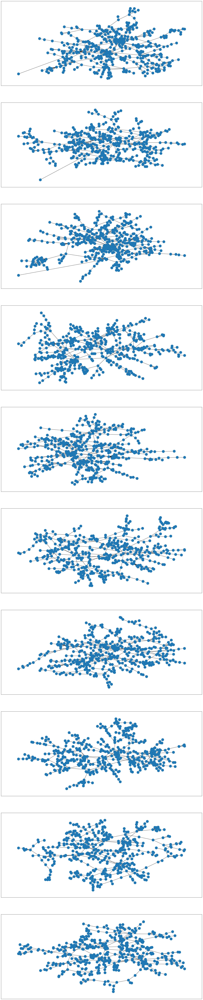

In [40]:
# Plotting all the filtered networks
figure, axes = plt.subplots(10, 1, figsize=(24, 120))
nx.draw_networkx(graph_2011_filtered, with_labels=False, ax=axes[0])
nx.draw_networkx(graph_2012_filtered, with_labels=False, ax=axes[1])
nx.draw_networkx(graph_2013_filtered, with_labels=False, ax=axes[2])
nx.draw_networkx(graph_2014_filtered, with_labels=False, ax=axes[3])
nx.draw_networkx(graph_2015_filtered, with_labels=False, ax=axes[4])
nx.draw_networkx(graph_2016_filtered, with_labels=False, ax=axes[5])
nx.draw_networkx(graph_2017_filtered, with_labels=False, ax=axes[6])
nx.draw_networkx(graph_2018_filtered, with_labels=False, ax=axes[7])
nx.draw_networkx(graph_2019_filtered, with_labels=False, ax=axes[8])
nx.draw_networkx(graph_2020_filtered, with_labels=False, ax=axes[9])

On plotting the graphs, we see that the network looks different every year, and no two yearwise graphs look very similar.

## **Computing Graph Statistics over Time**

In [43]:
# Creating a list of shortest path connecting all stocks for every year
average_shortest_path_length = []
year = [2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]

# Calculating the average shortest path for every year
for graph in [graph_2011_filtered, graph_2012_filtered, graph_2013_filtered, graph_2014_filtered, graph_2015_filtered,
             graph_2016_filtered, graph_2017_filtered, graph_2018_filtered, graph_2019_filtered, graph_2020_filtered]:
    average_shortest_path_length.append(nx.average_shortest_path_length(graph))

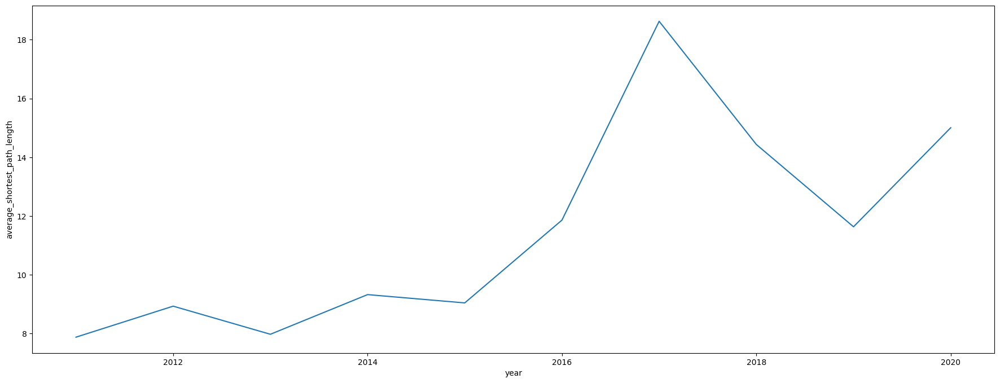

In [44]:
# Plotting the average shortest path for every year
figure = plt.figure(figsize=(22, 8))
sns.lineplot(x='year', y='average_shortest_path_length',
             data=pd.DataFrame({'year': year, 'average_shortest_path_length': average_shortest_path_length}));

From the above plot we can see that the shortest path length was more stable till 2015 but there was significant increment in 2016 and 2017 and again there was a decrement in 2018. In 2020 there an increment again.

## **Portfolio Construction**

In [45]:
# Creating a correlation matrix for all stocks from 2011-2020
log_returns_2011_till_2020 = np.log(price_data_cleaned.shift(1)) - np.log(price_data_cleaned)
return_correlation_2011_till_2020 = log_returns_2011_till_2020.corr()

pandas.core.frame.DataFrame

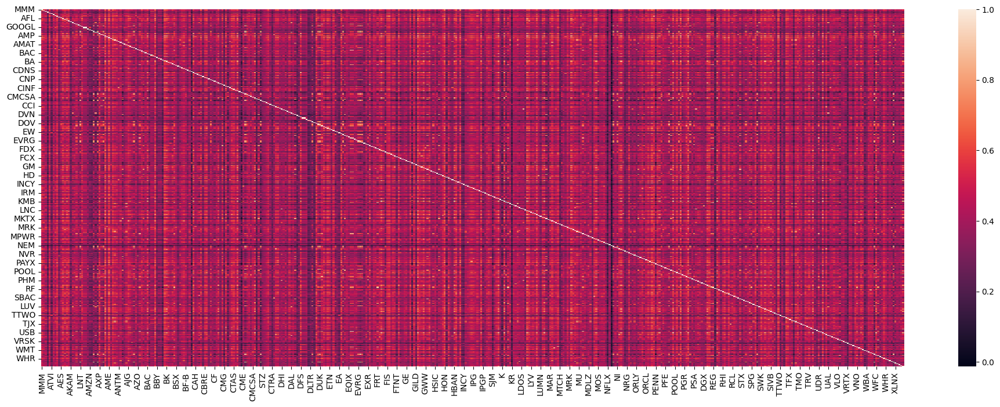

In [46]:
figure = plt.figure(figsize=(24, 8))
sns.heatmap(return_correlation_2011_till_2020);

In [47]:
# Creating distance matrix between every stock
distance_2011_till_2020 = np.sqrt(2 * (1 - return_correlation_2011_till_2020))
# Creating a network graph of the distance matrix
distance_2011_till_2020_graph = nx.Graph(distance_2011_till_2020)
# Filtering the graph to have the minimum spanning tree
distance_2011_till_2020_graph_filtered = nx.minimum_spanning_tree(distance_2011_till_2020_graph)

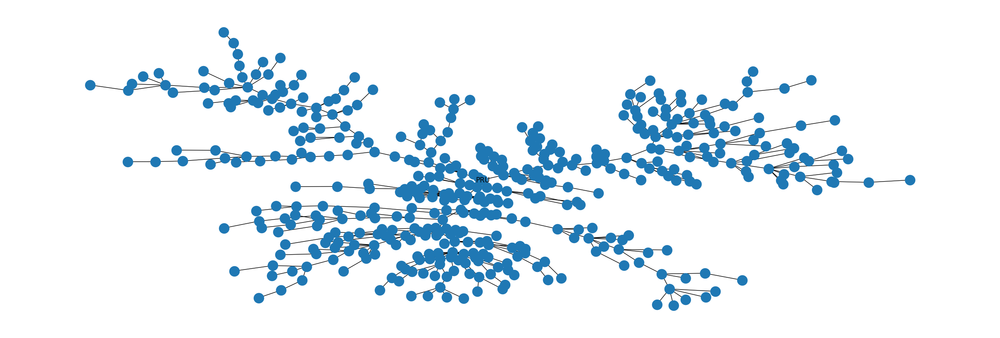

In [52]:
figure = plt.figure(figsize=(24, 8))
# Showing 1 label for visual purposes
labels = {node: node if node == 'PRU' else '' for node in graph_2011.nodes()}
# Kamada-Kaway Layout assures that the distances between nodes represent the distances
nx.draw_kamada_kawai(distance_2011_till_2020_graph_filtered,labels = labels, with_labels=True)

In [55]:
# Number of direct connections the node has
degree_centrality = nx.degree_centrality(distance_2011_till_2020_graph_filtered)
# How close the node is to all other nodes
closeness_centrality = nx.closeness_centrality(distance_2011_till_2020_graph_filtered)
# Reoccurence of the node being on the path to other nodes
betweenness_centrality = nx.betweenness_centrality(distance_2011_till_2020_graph_filtered)
# How influencial the node is (the quality of its connections)
eigenvector_centrality=nx.eigenvector_centrality_numpy(distance_2011_till_2020_graph_filtered)

In [63]:
# Creating a df for deg. of centrality for all stocks sorted in descending order.
keys = []
values = []

for key, value in degree_centrality.items():
    keys.append(key)
    values.append(value)

dc_data = pd.DataFrame({'stocks': keys, 'degree_centrality': values}).sort_values('degree_centrality',
                                                                                  ascending=False)
# Bar plot of the result
px.bar(data_frame=dc_data, x='stocks', y='degree_centrality', template='plotly_dark')

**Degree centrality** is the simplest centrality measure. It
defines the relative significance of a stock in terms of the
**number of edges incident upon it.** The stocks with the high
scores will influence the behavior of many other
stocks which are directly connected to it.

Based on this
measure, **HON has the highest number of edges with other
stocks and hence the highest degree centrality.**

In [ ]:
# Creating a df for closeness centrality for all stocks sorted in descending order.
keys = []
values = []

for key, value in closeness_centrality.items():
    keys.append(key)
    values.append(value)

cc_data = pd.DataFrame({'stocks': keys, 'closeness_centrality': values}).sort_values('closeness_centrality',
                                                                                       ascending=False)
# Bar plot of the result
px.bar(data_frame=cc_data, x='stocks', y='closeness_centrality', template='plotly_dark')

**Closeness centrality** also involves the shortest path
between all possible pairs of stocks on a network.

It is
defined as the average number of shortest paths between a
stock and all other stocks reachable from it.

In [ ]:
# Creating a df for betweenness centrality for all stocks sorted in descending order.
keys = []
values = []

for key, value in betweenness_centrality.items():
    keys.append(key)
    values.append(value)

bc_data = pd.DataFrame({'stocks': keys, 'betweenness_centrality': values}).sort_values('betweenness_centrality',
                                                                                       ascending=False)
# Bar plot of the results
px.bar(data_frame=bc_data, x='stocks', y='betweenness_centrality', template='plotly_dark')

**Betweenness centrality** is the sum of the fraction of all possible shortest paths between any stocks that pass through a stock. It is used to **quantify the control of a stock on information flow in the network.**

So, the stock with the highest score is considered a significant stock in terms of its role in coordinating the information among stocks.

In [69]:
# Creating a df for eigenvector_centrality for all stocks sorted in descending order.
keys = []
values = []

for key, value in eigenvector_centrality.items():
    keys.append(key)
    values.append(value)

ec_data = pd.DataFrame({'stocks': keys, 'eigenvector_centrality': values}).sort_values('eigenvector_centrality',
                                                                                        ascending=False)

# Bar plot of the result
px.bar(data_frame=ec_data, x='stocks', y='eigenvector_centrality', template='plotly_dark')

**Eigenvector centrality** is the quality of connections  determined by both the number of connections and the influence of those connected stocks. This reflects a more nuanced understanding of a stock's role within the network.

We can threfore say that HON has the most influencial connections.

## **Selecting Stocks based on Network Topological Parameters**

In [133]:
# Distance on degree criterion : distance from every node and the node with the most edges
distance_degree_criteria = {}
node_with_largest_degree_centrality = max(dict(degree_centrality), key=dict(degree_centrality).get)

# Going through every node and finding the distance from them and the most central node
for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_degree_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_largest_degree_centrality)

In [132]:
# Distance on correlation criterion : distance from every node with the node with the highest correlation
distance_correlation_criteria = {}
node_with_largest_corr = max(dict(eigenvector_centrality), key=dict(eigenvector_centrality).get)

# Going through every node and finding the correlation from them and the stock with the highest correlation to all
for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_correlation_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_largest_corr)

In [134]:
# Distance on distance criterion : distance from every node and the most central node
distance_distance_criteria = {}
node_with_largest_closeness = max(dict(closeness_centrality), key=dict(closeness_centrality).get)

# Going through every node and finding the distance from them and the most central node
for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_distance_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_largest_closeness)

**Distance refers to the smallest length from a node to the central node of the network**.

Here,
three types of definitions of central node are introduced to reduce the error caused by a single
method.

Therefore three types of distances are described here.

**1. Distance on degree criterion** (Ddegree), the central node is the one that has the largest centrality degree.

**2. Distance on correlation criterion** (Dcorrelation), the central node is the one with the highest sum of correlation coefficients with its neighbors.

**3. Distance on distance criterion** (Ddistance), the central node is the one that produces the lowest value for the mean distance between it and all the other nodes.

In [138]:
# Creating a df with the degree_centrality dict
node_stats = pd.DataFrame.from_dict(dict(degree_centrality), orient='index')
node_stats.columns = ['degree_centrality']
# Adding betweenness centrality to the df
node_stats['betweenness_centrality'] = betweenness_centrality.values()
# Calculating and adding average centrality to the df
node_stats['average_centrality'] = 0.5 * (node_stats['degree_centrality'] + node_stats['betweenness_centrality'])


# Adding the 3 previous distances calculated previously
node_stats['distance_degree_criteria'] = distance_degree_criteria.values()
node_stats['distance_correlation_criteria'] = distance_correlation_criteria.values()
node_stats['distance_distance_criteria'] = distance_distance_criteria.values()
# Calculating the average of all 3 distances
node_stats['average_distance'] = (node_stats['distance_degree_criteria'] + node_stats['distance_correlation_criteria'] +
                                  node_stats['distance_distance_criteria']) / 3

In [139]:
node_stats.head()

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
MMM,0.002227,0.000000,0.001114,2,2,7,3.666667
AOS,0.004454,0.022073,0.013264,6,6,5,5.666667
ABT,0.008909,0.056584,0.032746,9,9,8,8.666667
ABMD,0.002227,0.000000,0.001114,10,10,9,9.666667
ACN,0.006682,0.008899,0.007790,16,16,9,13.666667


We use the parameters defined above to select the portfolios.

**The 15 stocks with the largest average centrality are chosen to be in the central portfolio.**

**The 15 stocks with the highest average distance will be in the peripheral portfolio.**


The central portfolios and peripheral portfolios represent two opposite sides of correlation and agglomeration. Generally speaking, central stocks play a vital role in the market and impose a strong influence on other stocks. On the other hand, the correlations between peripheral stocks are weak and contain much more noise than those of the central stocks.

In [140]:
# Creating the central stock portfolio
central_stocks = node_stats.sort_values('average_centrality', ascending=False).head(15)
central_portfolio = [stock for stock in central_stocks.index.values]

In [141]:
# Creating the peripheral stock portfolio
peripheral_stocks = node_stats.sort_values('average_distance', ascending=False).head(15)
peripheral_portfolio = [stock for stock in peripheral_stocks.index.values]

In [142]:
central_stocks

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
PRU,0.011136,0.639884,0.325510,7,7,0,4.666667
AMP,0.028953,0.540198,0.284576,5,5,2,4.000000
LNC,0.015590,0.526050,0.270820,6,6,1,4.333333
AME,0.020045,0.517430,0.268737,4,4,3,3.666667
GL,0.017817,0.452504,0.235160,8,8,1,5.666667
PH,0.031180,0.389924,0.210552,2,2,5,3.000000
EMR,0.006682,0.414403,0.210542,3,3,4,3.333333
TFC,0.008909,0.400791,0.204850,10,10,3,7.666667
USB,0.006682,0.391624,0.199153,9,9,2,6.666667
PNC,0.008909,0.353911,0.181410,11,11,4,8.666667


In [143]:
peripheral_stocks

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
CHD,0.002227,0.000000,0.001114,24,24,17,21.666667
CAG,0.002227,0.000000,0.001114,23,23,16,20.666667
CLX,0.004454,0.004454,0.004454,23,23,16,20.666667
SJM,0.002227,0.000000,0.001114,22,22,15,19.666667
K,0.002227,0.000000,0.001114,22,22,15,19.666667
HRL,0.002227,0.000000,0.001114,22,22,15,19.666667
CPB,0.004454,0.004454,0.004454,22,22,15,19.666667
KMB,0.004454,0.008889,0.006672,22,22,15,19.666667
WBA,0.002227,0.000000,0.001114,21,21,14,18.666667
ATO,0.002227,0.000000,0.001114,21,21,14,18.666667


### **Visual of the 15 Central and Peripheral Stocks in th network**

In [144]:
# Adding a color to the nodes in the central or peripheral portfolio
color = []

for node in distance_2011_till_2020_graph_filtered:
    if node in central_portfolio:
        color.append('red')

    elif node in peripheral_portfolio:
        color.append('green')

    else:
        color.append('black')

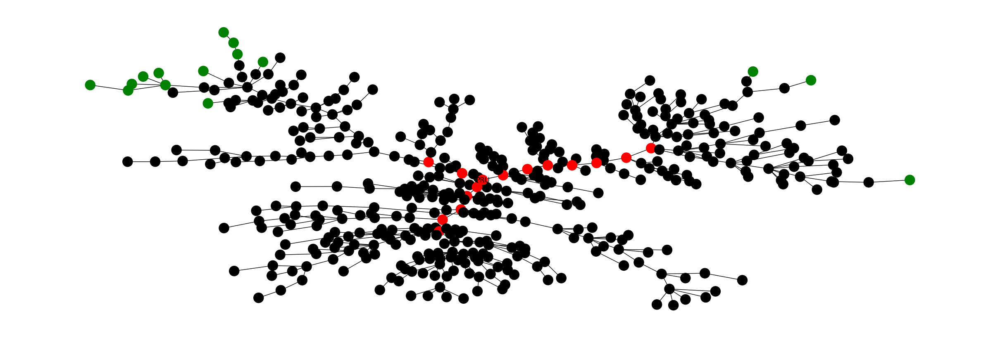

In [145]:
# Plotting the network with red as central stocks and green as peripheral
figure = plt.figure(figsize=(24, 8))
labels = {node: node if node == 'PRU' else '' for node in distance_2011_till_2020_graph_filtered.nodes()}
nx.draw_kamada_kawai(distance_2011_till_2020_graph_filtered, labels = labels, with_labels=True, node_color=color)

## **Performance Evalutation**

Here we evaluate the performance of the stocks by comparing the performance of the Central Portfolio, Peripheral and S&P 500 Stocks in 2021, and **finding out which portfolio performs the best.**

In [146]:
# Reading data for 2021 S&P 500 stocks:
price_data_2021 = pd.read_csv('/content/drive/MyDrive/MIT_certificate/Notes/Data_sets/snp500_price_data_2021 (1).csv', index_col=[0])

In [147]:
price_data_2021.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178,NaN
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663,NaN
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590,NaN
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484,NaN
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558,NaN


In [148]:
# Fetching data for the s&p500 through the Federal Reserve Economic Data
snp_500_2021 = web.DataReader(['sp500'], 'fred', start='2021-01-01', end='2021-12-31')

In [149]:
snp_500_2021.head()

,sp500
DATE,
2021-01-01,NaN
2021-01-04,3700.65
2021-01-05,3726.86
2021-01-06,3748.14
2021-01-07,3803.79


In [150]:
# Data for S&P500 starts on 2021-01-04 ; need to change our price data to start at that date
price_data_2021 = price_data_2021['2021-01-04':]

In [151]:
# Removing NaN values:
price_data_2021 = price_data_2021.dropna(axis=1)
snp_500_2021 = snp_500_2021.dropna()

In [152]:
# Calculating the return for every portfolio

amount = 100000

# Creating a DF for central portfolio
central_portfolio_value = pd.DataFrame()
# Associating the central portfolio stock prices with every day of 2021
for stock in central_portfolio:
    central_portfolio_value[stock] = price_data_2021[stock]
# Calculating the total sum of stock prices from the first day of 2021
portfolio_unit = central_portfolio_value.sum(axis=1)[0]
# Calculating amount of shares
share = amount / portfolio_unit
# Calculating the sum value of the portfolio for every day of 2021
central_portfolio_value = central_portfolio_value.sum(axis=1) * share

# Repeating same steps as for central portfolio
peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = price_data_2021[stock]
portfolio_unit = peripheral_portfolio_value.sum(axis=1)[0]
share = amount / portfolio_unit
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis=1) * share

# Calculating the amount of shares we can buy with the amount
# Then multiplying amount of shares by S&P 500 stock price for every day of 2021
snp_500_2021_value = snp_500_2021 * (amount / snp_500_2021.iloc[0])

In [153]:
# Creating DF with all portfolios
all_portfolios = snp_500_2021_value
all_portfolios['central_portfolio'] = central_portfolio_value.values
all_portfolios['peripheral_portfolio'] = peripheral_portfolio_value.values

In [154]:
all_portfolios.head()

,sp500,central_portfolio,peripheral_portfolio
DATE,,,
2021-01-04,100000.000000,100000.000000,100000.000000
2021-01-05,100708.253955,100426.138652,99911.532803
2021-01-06,101283.288071,104249.598589,99165.855978
2021-01-07,102787.077946,105184.349194,99511.870053
2021-01-08,103351.573372,105127.033059,99586.017687


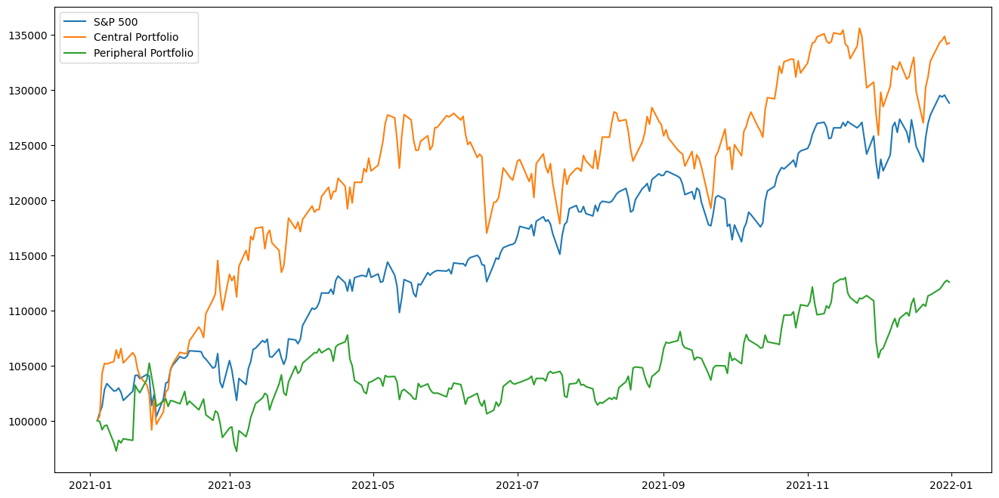

In [155]:
# Plotting a visual representation of the return for every portfolio
figure, ax = plt.subplots(figsize=(16, 8))
snp_500_line = ax.plot(all_portfolios['sp500'], label='S&P 500')
central_portfolio_line = ax.plot(all_portfolios['central_portfolio'], label= 'Central Portfolio')
peripheral_portfolio_line = ax.plot(all_portfolios['peripheral_portfolio'], label= 'Peripheral Portfolio')
ax.legend(loc='upper left')
plt.show()

As seen from the above plot, it is clear that **the Central Portfolio stocks perform better and the Peripheral Portfolio stocks perform poorer in comparison to the S&P 500 stocks in 2021.**

   Both the portfolios have their own features under different market conditions.
   
   Generally, **in stable market conditions Central Portfolio Stocks will perform better whereas Peripheral Portfolio Stocks will perform better in crisis market conditions**. This is due to peripheral portfolio stocks having a weaker correlation to the S&P 500
  